# Predicting land acquisition cost and forest change across Massachusetts 

## Set up Jupyter environment and prepare the data

In [5]:
import pandas as pd 
import numpy as np
import geopandas as gpd 
import matplotlib.pyplot as plt 
pd.options.display.float_format = '{:.2f}'.format

In [6]:
def wf(x): 
    return '/Users/jiunlee/Documents/Fall_23/EE508/Labs/Lab3/' + x

In [7]:
shp = gpd.read_file(wf('pc_MA_EE508.shp')) # GeoDataframe
shp.set_index('pid', inplace=True) #set index to column "pid"
shp

,geometry
pid,
M_252104_934240,"POLYGON ((252253.238 934287.036, 252240.074 93..."
F_803174_3027860,"POLYGON ((244848.861 922901.341, 244830.509 92..."
M_238118_942044,"POLYGON ((238169.901 942152.056, 238201.019 94..."
F_736007_3068967,"POLYGON ((224650.310 935515.699, 224649.878 93..."
M_240445_943056,"POLYGON ((240322.960 942971.725, 240310.209 94..."
...,...
M_67459_886161,"POLYGON ((68137.926 885776.905, 68076.906 8857..."
F_172467_2984485,"POLYGON ((53119.157 910368.374, 53143.475 9102..."
M_66650_919364,"POLYGON ((67462.518 920760.161, 67364.885 9203..."


In [8]:
d=pd.read_csv(wf('pc_MA_EE508.csv')) #dataframe
d.set_index('pid', inplace=True) #set index to column "pid"
d

/var/folders/n_/44qv0dbs5vs6nm55y9wjtfr80000gn/T/ipykernel_29173/4266027894.py:1: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  d=pd.read_csv(wf('pc_MA_EE508.csv')) #dataframe


,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,p_pasture,p_crops,p_wetland_w,p_wetland_e,pop_dens_bg_2012-2016,pop_dens_tract_2012-2016,hh_inc_med_bg_2012-2016,hh_inc_med_tract_2012-2016,hh_inc_avg_bg_2012-2016,hh_inc_avg_tract_2012-2016
pid,,,,,,,,,,,,,,,,,,,,,
M_252104_934240,25009,27900,4.63,2.68,19.00,16.00,0.00,211.20,0.00,0.00,...,0.00,0.00,42.00,0.00,90.84,187.17,93694.00,85952.00,119735.95,100460.59
F_803174_3027860,25009,16250,1.14,3.27,8.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,475.46,527.58,71167.00,98264.00,107637.26,111868.26
M_238118_942044,25009,27620,3.05,6.32,14.00,10.00,0.00,0.00,0.00,0.00,...,6.00,0.00,0.00,0.00,184.10,274.51,94929.00,96512.00,127585.10,115417.94
F_736007_3068967,25009,1465,10.28,2.21,5.67,5.00,0.58,0.00,0.00,0.00,...,0.00,0.00,7.00,1.00,155.80,247.73,114083.00,154922.00,184615.59,182983.42
M_240445_943056,25009,27620,2.17,2.54,20.00,48.00,0.00,0.00,0.00,0.00,...,0.00,0.00,50.00,0.00,184.10,274.51,94929.00,96512.00,127585.10,115417.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_67459_886161,25003,51580,110.00,4.77,71.33,34.00,0.00,0.00,1640.00,1523.30,...,2.00,0.00,18.00,1.00,15.49,10.37,74583.00,69306.00,90927.27,84795.13
F_172467_2984485,25003,53960,115.05,2.96,46.86,40.00,0.00,0.00,604.40,390.77,...,2.00,5.00,10.00,6.00,52.59,181.48,78083.00,80388.00,88131.58,94874.91
M_66650_919364,25003,16180,164.33,7.35,98.12,2.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,41.54,117.97,70982.00,55774.00,90679.29,74035.66


In [9]:
shp_ma_outline = gpd.read_file(wf('MA_outline.shp'))
shp_ma_outline

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,25,001,00606927,25001,Barnstable,Barnstable County,06,H1,G4020,148,12700,None,A,1020989893,-1934621232,+41.7990145,-070.2118803,"MULTIPOLYGON (((281070.140 813463.319, 281070...."


`pid`: parcel ID in Massachusetts that are larger than one hectare (nobs = 220,187. Note that the 'pid' is unique for all parcels in Massachusetts: we can use it to join shp and d.

### Create Geodataframe of parcel's centroids

Because the shapefile is too large (198MB) to plot values of new variables (e.g. predicted values, model residuals) for up to 200k parcels, making maps of parcel polygons with plot will be very slow. A faster workaround is to plot only the parcel centroids as points, and scale them by the size of the parcel: this reduces plotting time by a factor of four.

In [10]:
shp_c = shp.copy() #copy of `shp` to make geodataframe of parcel's centroids
shp_c['geometry'] = shp_c['geometry'].centroid #Set its geometry to the centroid of the polygons
# replaces the original polygon geometries in shp_c with their centroid points.
print(shp_c.head())
print(shp.head())

                                       geometry
pid                                            
M_252104_934240   POINT (252103.857 934239.867)
F_803174_3027860  POINT (244807.918 922893.447)
M_238118_942044   POINT (238099.159 942052.146)
F_736007_3068967  POINT (224335.533 935423.153)
M_240445_943056   POINT (240370.270 943069.127)
                                                           geometry
pid                                                                
M_252104_934240   POLYGON ((252253.238 934287.036, 252240.074 93...
F_803174_3027860  POLYGON ((244848.861 922901.341, 244830.509 92...
M_238118_942044   POLYGON ((238169.901 942152.056, 238201.019 94...
F_736007_3068967  POLYGON ((224650.310 935515.699, 224649.878 93...
M_240445_943056   POLYGON ((240322.960 942971.725, 240310.209 94...


In [11]:
# Scale the point size in proportion to the size of the parcels by calling plot with a markersize argument
shp_c['ms'] = d['ha'] / 10 #Add Marker Size Column to shp_c

<Axes: >

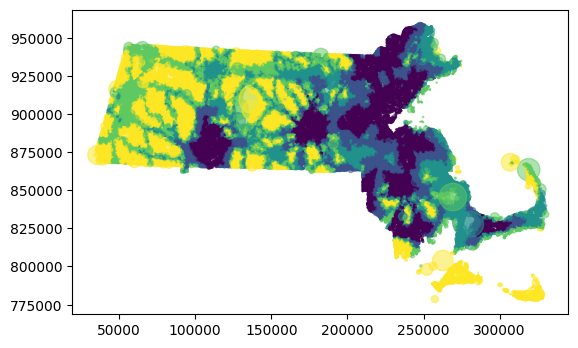

In [12]:
shp_c.join(d[['travel']], on='pid').plot('travel', markersize='ms', alpha=0.5, scheme='quantiles')

### Create variables before modeling

In [13]:
# The outcome variable for our deforestation risk estimation 

d['p_f_change'] = d['p_f_2010'] - d['p_f_1990'] 
## the change in the percentage of parcel-level forest cover between 1990 and 2010
## p_f_YYYY: Percent forest cover in the year YYYY


# The outcome variable for our cost estimation
d['ls_price_per_ha_log'] = np.log(d['ls_price'] / d['ha'])
## the log of the per-hectare sale price of the last sale of the property ('ls_price')


# include independent variable: the year of the last sale in order to identify recent sales 

d['ls_year'] = pd.to_datetime(d['ls_date']).dt.year
##transforms a Series with dates in string format to a date format 
##and then uses the dt (short for date) accessor to obtain its year


# percentage of easement ('p_e') on a property at the time of its last sale (ls)
d['p_e_ls'] = np.where(d['e_year'] <= d['ls_year'], d['p_e'], 0)
## `e_year`: the year of the easement creation 
## before the year of the easement creation ('e_year'), there was no easement on the property

# normalize the building area to the parcel size (akin to building density)
d['bld_area_per_ha'] = d['bld_area'] / d['ha'] #calculate the building area per hectare


### Create one dataset to predict last sale prices (for which we will use the suffix _ls) and another one to estimate the probability of forest change (for which we will use the suffix _fc).

In [14]:
#different sets of predictor variables for the sale price and the forest change model
XCOLS_LS = ['slope', 'travel', 'p_wet', 'coast_2500', 'river_frontage',
'lake_frontage', 'pop_dens_tract_2012-2016',
'hh_inc_avg_tract_2012-2016',
'p_f_2000', 'p_prot_2000_500',
'p_d_2000_200', 'p_d_2000_1000', 'p_d_2000_5000',
'p_dev_open', 'p_dev_low', 'p_dev_medium', 'p_dev_high',
'p_crops', 'p_pasture','p_grassland', 'bld_area_per_ha',
'ls_year'] #use sales data starting in 2000.

XCOLS_FC = ['slope', 'travel', 'p_wet', 'coast_2500', 'river_frontage',
'lake_frontage', 'pop_dens_tract_2012-2016',
'hh_inc_avg_tract_2012-2016',
'p_f_1990', 'p_prot_1990_500',
'p_d_1990_200', 'p_d_1990_1000', 'p_d_1990_5000'] 
#Forest change is a phenomenon that happens rarely, so we choose as long as a time period as possible (20 years) to get a sense of patterns.

In [15]:
# last sale prices dataset
# use year-2011 land cover classes and recent building data in the sales price model, 
# as they provide a proxy for land use
i_ls = d[XCOLS_LS].isnull().sum(1).eq(0)  #make it have no missing values in the predictors
i_ls &= d['ls_year'].ge(2000)
i_ls &= d['ls_year'].le(2019) #sold between 2000 and 2019
i_ls &= d['p_e_ls'] == 0 #not protected by an easement at the time they were sold

X_ls = d.loc[i_ls, XCOLS_LS].copy() #create dataframe with those rows(i_ls) and columns(XCOLS_LS)
y_ls = d.loc[i_ls, 'ls_price_per_ha_log'].copy() #create Series of outcome variable

X_ls['ls_year'] = X_ls['ls_year'].astype(int) #turn year values from floats into integers.

In [19]:
X_ls

,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,pop_dens_tract_2012-2016,hh_inc_avg_tract_2012-2016,p_f_2000,p_prot_2000_500,...,p_d_2000_5000,p_dev_open,p_dev_low,p_dev_medium,p_dev_high,p_crops,p_pasture,p_grassland,bld_area_per_ha,ls_year
pid,,,,,,,,,,,,,,,,,,,,,
M_245474_951109,1.78,19.00,21.00,7.00,0.00,0.00,117.58,163715.53,0,3,...,23,30.00,0.00,0.00,0.00,0.00,52.00,0.00,1055.50,2002
F_778757_3113679,7.64,8.00,4.00,4.13,0.00,0.00,710.83,86602.90,99,30,...,34,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,2002
M_252159_944747,0.46,30.00,116.00,3.33,0.00,218.80,106.76,113806.33,20,41,...,10,0.00,5.00,0.00,0.00,0.00,0.00,0.00,1008.28,2010
M_237495_934269,0.46,25.33,161.00,0.00,0.00,0.00,244.92,171520.76,100,13,...,14,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2009
F_779533_3113660,3.85,8.00,1.00,4.80,0.00,0.00,710.83,86602.90,53,5,...,34,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_64962_909153,5.51,141.00,12.00,0.00,0.00,0.00,34.79,73666.82,98,0,...,6,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2014
M_45561_902719,6.84,52.00,1.00,0.00,0.00,0.00,14.06,124908.11,87,0,...,11,0.00,0.00,0.00,0.00,6.00,5.00,0.00,0.00,2002
M_51514_873513,4.10,285.40,3.00,0.00,0.00,128.40,11.57,99877.74,81,6,...,4,1.00,0.00,0.00,0.00,0.00,17.00,0.00,155.90,2015


In [17]:
y_ls

pid
M_245474_951109    11.84
F_778757_3113679   11.39
M_252159_944747    11.78
M_237495_934269    11.21
F_779533_3113660   12.48
                    ... 
M_64962_909153      9.22
M_45561_902719     10.32
M_51514_873513      6.78
M_61097_910365     12.32
M_74987_889210      8.57
Name: ls_price_per_ha_log, Length: 44424, dtype: float64

In [18]:
#forest change dataset
i_fc = d[XCOLS_FC].isnull().sum(1).eq(0) #rows that have no missing values in the predictors
print(len(i_fc))
i_fc &= d['p_prot'] <= 5 #rows that were never protected (because protection changes the default forest change pattern)
#selecting parcels whose 'p_prot' value is smaller than or equal to 5 (i.e. 5%)
print(len(i_fc))

X_fc = d.loc[i_fc, XCOLS_FC].copy()
y_fc = d.loc[i_fc, 'p_f_change'].copy()

print(len(X_fc))
print(len(d))

220187
220187
177277
220187


## Linear regressions in statsmodels 

### Simple Linear regression

In [21]:
import statsmodels.api as sm
model_ls_ols = sm.OLS(y_ls, sm.add_constant(X_ls)).fit()
model_ls_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.455
Model:                             OLS   Adj. R-squared:                  0.455
Method:                  Least Squares   F-statistic:                     1687.
Date:                 Thu, 04 Jan 2024   Prob (F-statistic):               0.00
Time:                         23:38:26   Log-Likelihood:                -78212.
No. Observations:                44424   AIC:                         1.565e+05
Df Residuals:                    44401   BIC:                         1.567e+05
Df Model:                           22                                         
Covariance Type:             nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -52.9732      2.823    -18.764      0.000     -58.507     -47.440
slope                         -0.0266      0.002    -10.791      0.000      -0.031      -0.022
travel                        -0.0006      0.000     -6.079      0.000      -0.001      -0.000
p_wet                         -0.0050      0.000    -24.097      0.000      -0.005      -0.005
coast_2500                     0.0298      0.001     29.846      0.000       0.028       0.032
river_frontage             -2.028e-05   7.75e-05     -0.262      0.794      -0.000       0.000
lake_frontage                 -0.0007   5.09e-05    -12.880      0.000      -0.001      -0.001
pop_dens_tract_2012-2016   -3.011e-05   1.99e-05     -1.511      0.131   -6.92e-05    8.94e-06
hh_inc_avg_tract_2012-2016  1.322e-05   1.88e-07     70.248      0.000    1.29e-05    1.36e-05
p_f_2000                      -0.0059      0.000    -16.005      0.000      -0.007      -0.005
p_prot_2000_500            -2.324e-05      0.001     -0.046      0.964      -0.001       0.001
p_d_2000_200                   0.0124      0.001     17.975      0.000       0.011       0.014
p_d_2000_1000                 -0.0002      0.001     -0.250      0.803      -0.002       0.002
p_d_2000_5000                  0.0154      0.001     16.528      0.000       0.014       0.017
p_dev_open                     0.0036      0.001      6.977      0.000       0.003       0.005
p_dev_low                      0.0075      0.001      9.104      0.000       0.006       0.009
p_dev_medium                   0.0150      0.001     20.060      0.000       0.013       0.016
p_dev_high                     0.0045      0.001      5.636      0.000       0.003       0.006
p_crops                       -0.0038      0.001     -4.302      0.000      -0.006      -0.002
p_pasture                     -0.0002      0.001     -0.382      0.702      -0.001       0.001
p_grassland                    0.0024      0.001      2.224      0.026       0.000       0.004
bld_area_per_ha              1.86e-05   6.64e-07     28.024      0.000    1.73e-05    1.99e-05
ls_year                        0.0315      0.001     22.385      0.000       0.029       0.034
==============================================================================
Omnibus:                     7448.307   Durbin-Watson:                   1.958
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34364.698
Skew:                          -0.752   Prob(JB):                         0.00
Kurtosis:                       7.038   Cond. No.                     4.82e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is 

In [22]:
model_ls_ols.fittedvalues #the predicted (fitted) values as a Series

pid
M_245474_951109    13.06
F_778757_3113679   11.05
M_252159_944747    11.46
M_237495_934269    11.32
F_779533_3113660   12.09
                    ... 
M_64962_909153     10.61
M_45561_902719     11.14
M_51514_873513     10.99
M_61097_910365     11.00
M_74987_889210     10.05
Length: 44424, dtype: float64

In [23]:
model_ls_ols.resid #residuals as a Series

pid
M_245474_951109    -1.22
F_778757_3113679    0.34
M_252159_944747     0.32
M_237495_934269    -0.11
F_779533_3113660    0.38
                    ... 
M_64962_909153     -1.38
M_45561_902719     -0.82
M_51514_873513     -4.21
M_61097_910365      1.33
M_74987_889210     -1.49
Length: 44424, dtype: float64

#### Create a map of predicted values of land sales price

Text(0.5, 1.0, 'Predicted values of land acquisition cost: Linear Regression')

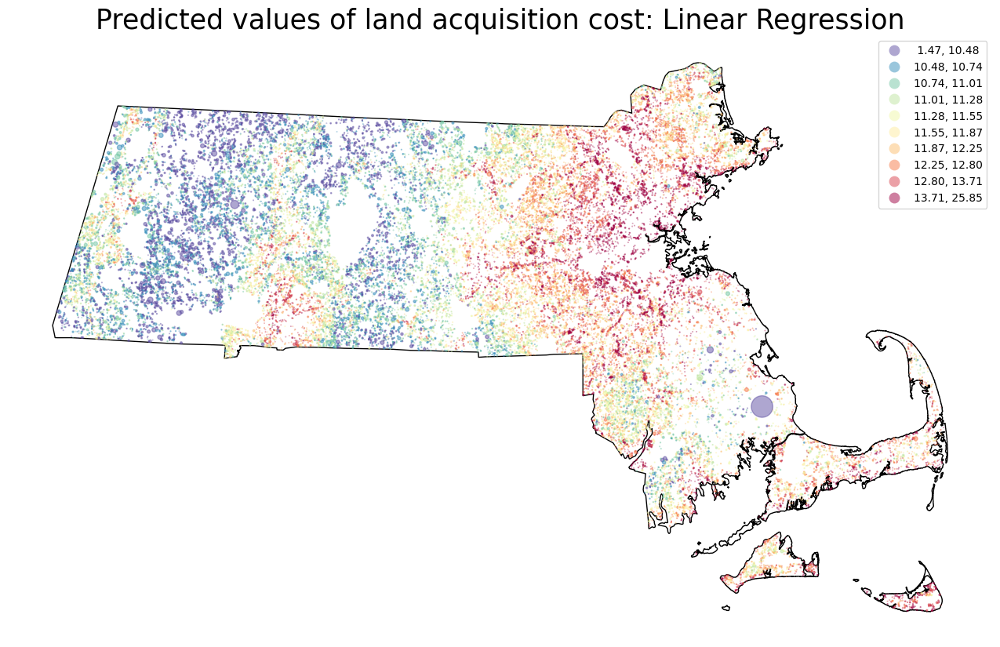

In [24]:

fig, ax = plt.subplots(figsize=(17, 10))
dp = shp_c.join(model_ls_ols.fittedvalues.rename('pred'), how='inner')
#inner join is necessary so that only observations having predicted values are retained.
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
    )
ax.axis('off')

ax.set_title('Predicted values of land acquisition cost: Linear Regression', fontdict={'fontsize': '25', 'fontweight' : '3'})

Text(0.5, 1.0, 'Residuals of Linear Regression Model')

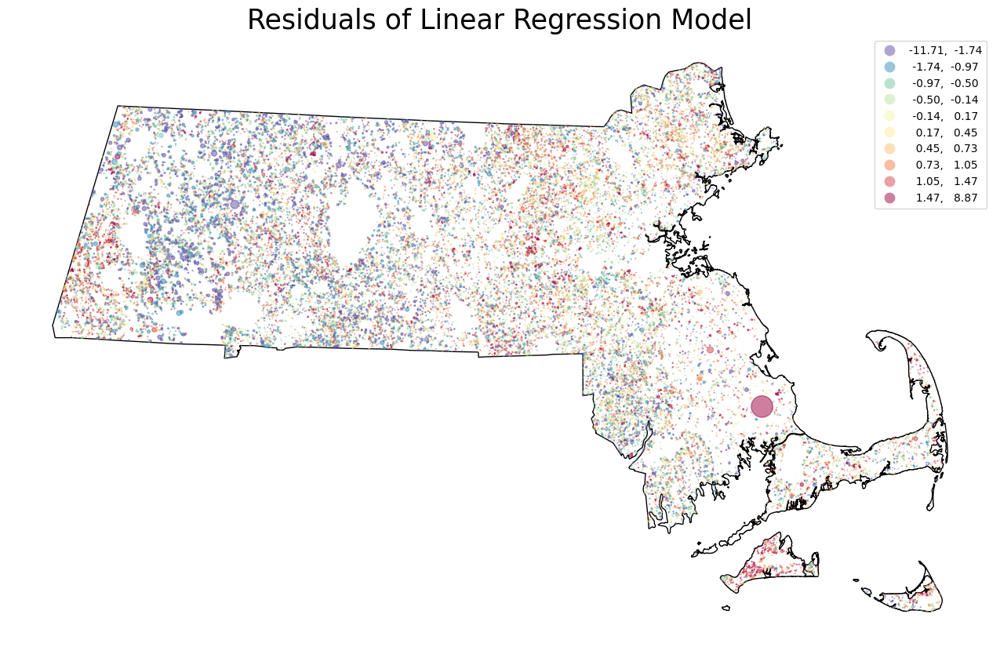

In [25]:
# Create a map of the residuals

fig, ax = plt.subplots(figsize=(17, 10))
dp = shp_c.join(model_ls_ols.resid.rename('resid'), how='inner')
#inner join is necessary so that only observations having predicted values are retained.
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp.plot(
    'resid',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
    )
ax.axis('off')


ax.set_title('Residuals of Linear Regression Model', fontdict={'fontsize': '25', 'fontweight' : '3'})

#### Let see whether we have a temporal trend in the residuals, by plotting the mean of the residuals in each year against the year

<AxesSubplot:xlabel='ls_year'>

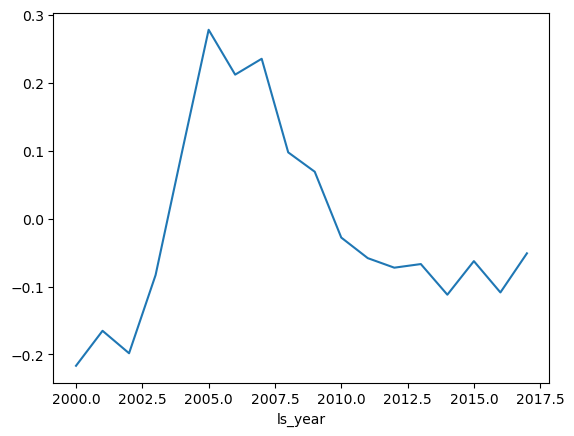

In [20]:
df = X_ls[['ls_year']].join(model_ls_ols.resid.rename('resid')) #create a DataFrame that has ls_year and the residuals as columns
df.groupby('ls_year')['resid'].mean().plot() #compute and plot the mean of the residuals by ls_year

In [21]:
#MSE of the current model
model_ls_ols.resid.pow(2).mean()

1.9803298297533192

In [31]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_ls, model_ls_ols.fittedvalues)

1.9803298297533176

### Linear Regression model 2: Remove the time trend

#### Remove the (irregular) time trend by using year dummies 

In [32]:
# create year dummies
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(categories='auto').fit(X_ls[['ls_year']]) #find all the categories (years) automatically by "fitting" it to the ls_year column
dummies_array = enc.transform(X_ls[['ls_year']]).toarray() #transform the data in the ls_year column into a 2D-array of dummy values
dummies_df = pd.DataFrame(  #turn that array into a DataFrame
dummies_array,
index=X_ls.index,
columns=[v[8:] for v in enc.get_feature_names_out()],
)

In [33]:
dummies_df

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
pid,,,,,,,,,,,,,,,,,,
M_245474_951109,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
F_778757_3113679,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
M_252159_944747,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
M_237495_934269,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
F_779533_3113660,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_64962_909153,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
M_45561_902719,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
M_51514_873513,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00


In [34]:
#create a new version of X_ls, replace the ls_year column with year dummies
X_ls2 = X_ls.drop(columns='ls_year').join(dummies_df).drop(columns='2000')
#choose one reference category (year), and omit it from the regression (we omit '2000')

In [35]:
#Run the regression with the new dataset of explanatory variables X_ls2.
model_ls_ols2 = sm.OLS(y_ls, sm.add_constant(X_ls2)).fit()
model_ls_ols2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.462
Model:                             OLS   Adj. R-squared:                  0.461
Method:                  Least Squares   F-statistic:                     1002.
Date:                 Thu, 04 Jan 2024   Prob (F-statistic):               0.00
Time:                         23:40:38   Log-Likelihood:                -77948.
No. Observations:                44424   AIC:                         1.560e+05
Df Residuals:                    44385   BIC:                         1.563e+05
Df Model:                           38                                         
Covariance Type:             nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          9.7614      0.053    182.862      0.000       9.657       9.866
slope                         -0.0274      0.002    -11.177      0.000      -0.032      -0.023
travel                        -0.0007      0.000     -6.493      0.000      -0.001      -0.000
p_wet                         -0.0051      0.000    -24.486      0.000      -0.005      -0.005
coast_2500                     0.0300      0.001     30.207      0.000       0.028       0.032
river_frontage             -3.626e-05   7.71e-05     -0.471      0.638      -0.000       0.000
lake_frontage                 -0.0007   5.07e-05    -12.922      0.000      -0.001      -0.001
pop_dens_tract_2012-2016   -3.376e-05   1.98e-05     -1.704      0.088   -7.26e-05    5.08e-06
hh_inc_avg_tract_2012-2016  1.316e-05   1.87e-07     70.301      0.000    1.28e-05    1.35e-05
p_f_2000                      -0.0058      0.000    -16.027      0.000      -0.007      -0.005
p_prot_2000_500              8.67e-05      0.001      0.172      0.864      -0.001       0.001
p_d_2000_200                   0.0126      0.001     18.356      0.000       0.011       0.014
p_d_2000_1000                 -0.0004      0.001     -0.486      0.627      -0.002       0.001
p_d_2000_5000                  0.0155      0.001     16.736      0.000       0.014       0.017
p_dev_open                     0.0034      0.001      6.633      0.000       0.002       0.004
p_dev_low                      0.0073      0.001      9.010      0.000       0.006       0.009
p_dev_medium                   0.0146      0.001     19.662      0.000       0.013       0.016
p_dev_high                     0.0040      0.001      5.138      0.000       0.002       0.006
p_crops                       -0.0039      0.001     -4.439      0.000      -0.006      -0.002
p_pasture                     -0.0001      0.001     -0.253      0.801      -0.001       0.001
p_grassland                    0.0021      0.001      2.037      0.042    8.14e-05       0.004
bld_area_per_ha             1.866e-05    6.6e-07     28.272      0.000    1.74e-05       2e-05
2001                           0.0837      0.039      2.160      0.031       0.008       0.160
2002                           0.0817      0.038      2.152      0.031       0.007       0.156
2003                           0.2283      0.038      6.033      0.000       0.154       0.302
2004                           0.4424      0.037     12.035      0.000       0.370       0.514
2005                           0.6535      0.037     17.885      0.000       0.582       0.725
2006                           0.6194      0.037     16.565      0.000       0.546       0.693
2007                           0.6743      0.038     17.898      0.000       0.600       0.748
2008                           0

In [36]:
mean_squared_error(y_ls, model_ls_ols2.fittedvalues) #Model has been improved.

1.957007091650473

<Axes: >

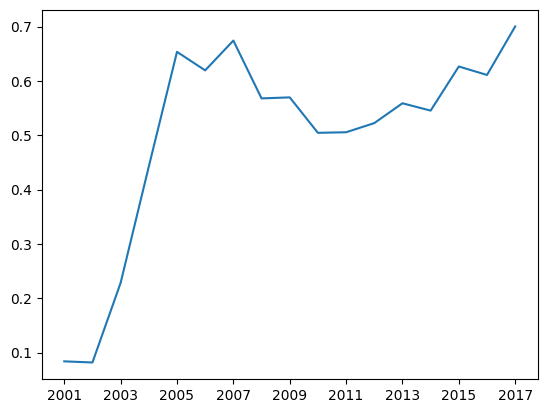

In [37]:
#Plot the coefficient estimates of the year dummies:
model_ls_ols2.params.loc['2001':'2017'].plot()

### Linear Regression model 3: add quadratic and interaction terms

#### add quadratic terms and interactions between variables

In [38]:
#Create a new dataset X_ls3 that includes quadratic terms and interactions for all variables other than the year dummies

# Add quadratic terms and interactions
from itertools import combinations
X_ls3 = X_ls.drop(columns='ls_year').copy()
cols = X_ls3.columns
for v in cols:
    X_ls3[v + '^2'] = X_ls3[v] ** 2
for v1, v2 in combinations(cols,2):
    X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
X_ls3 = X_ls3.join(dummies_df)

/var/folders/n_/44qv0dbs5vs6nm55y9wjtfr80000gn/T/ipykernel_29173/3182244915.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
/var/folders/n_/44qv0dbs5vs6nm55y9wjtfr80000gn/T/ipykernel_29173/3182244915.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
/var/folders/n_/44qv0dbs5vs6nm55y9wjtfr80000gn/T/ipykernel_29173/3182244915.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.inser

In [39]:
model_ls_ols3 = sm.OLS(y_ls, sm.add_constant(X_ls3)).fit()
model_ls_ols3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.537
Model:                             OLS   Adj. R-squared:                  0.534
Method:                  Least Squares   F-statistic:                     190.2
Date:                 Thu, 04 Jan 2024   Prob (F-statistic):               0.00
Time:                         23:41:01   Log-Likelihood:                -74613.
No. Observations:                44424   AIC:                         1.498e+05
Df Residuals:                    44154   BIC:                         1.521e+05
Df Model:                          269                                         
Covariance Type:             nonrobust                                         
=======================================================================================================================
                                                          coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                   9.6012      0.191     50.254      0.000       9.227       9.976
slope                                                  -0.0174      0.020     -0.877      0.380      -0.056       0.021
travel                                                 -0.0016      0.001     -1.762      0.078      -0.003       0.000
p_wet                                                  -0.0138      0.001    -10.100      0.000      -0.016      -0.011
coast_2500                                              0.0679      0.009      7.977      0.000       0.051       0.085
river_frontage                                          0.0053      0.001      9.006      0.000       0.004       0.006
lake_frontage                                          -0.0021      0.000     -4.445      0.000      -0.003      -0.001
pop_dens_tract_2012-2016                                0.0009      0.000      4.706      0.000       0.001       0.001
hh_inc_avg_tract_2012-2016                           2.146e-05   1.42e-06     15.101      0.000    1.87e-05    2.42e-05
p_f_2000                                               -0.0146      0.003     -5.670      0.000      -0.020      -0.010
p_prot_2000_500                                         0.0017      0.004      0.484      0.629      -0.005       0.009
p_d_2000_200                                            0.0138      0.004      3.101      0.002       0.005       0.022
p_d_2000_1000                                           0.0258      0.006      4.535      0.000       0.015       0.037
p_d_2000_5000                                          -0.0066      0.006     -1.053      0.292      -0.019       0.006
p_dev_open                                              0.0025      0.003      0.817      0.414      -0.003       0.008
p_dev_low                                              -0.0023      0.005     -0.430      0.667      -0.013       0.008
p_dev_medium                                            0.0095      0.006      1.580      0.114      -0.002       0.021
p_dev_high                                             -0.0162      0.008     -1.902      0.057      -0.033       0.000
p_crops                                                 0.0026      0.007      0.348      0.728      -0.012       0.017
p_pasture                                              -0.0241      0.004     -6.016      0.000      -0.032      -0.016
p_grassland                                            -0.0202      0.007     -2.732      0.006      -0.035      -0.006
bld_area_per_ha                                      5.731e-05   5.32e-06     10.776      0.000    4.69e-05    6.77e-05
slope^2                                                 0.0009      0.00

In [43]:
ols = mean_squared_error(y_ls, model_ls_ols.fittedvalues)
ols2 = mean_squared_error(y_ls, model_ls_ols2.fittedvalues)
ols3 = mean_squared_error(y_ls, model_ls_ols3.fittedvalues)
df = { "model":["ols","ols2","ols3"], "mean_squared_error":[ols,ols2,ols3]}
print(df)
mse_within = pd.DataFrame(data=df).set_index('model')
mse_within.to_csv("1_mean_prediction_error_within_sample.csv",index=True ) 

{'model': ['ols', 'ols2', 'ols3'], 'mean_squared_error': [1.9803298297533176, 1.957007091650473, 1.6841173295572491]}


#### Create maps of the predicted values and residuals of the LR3 model

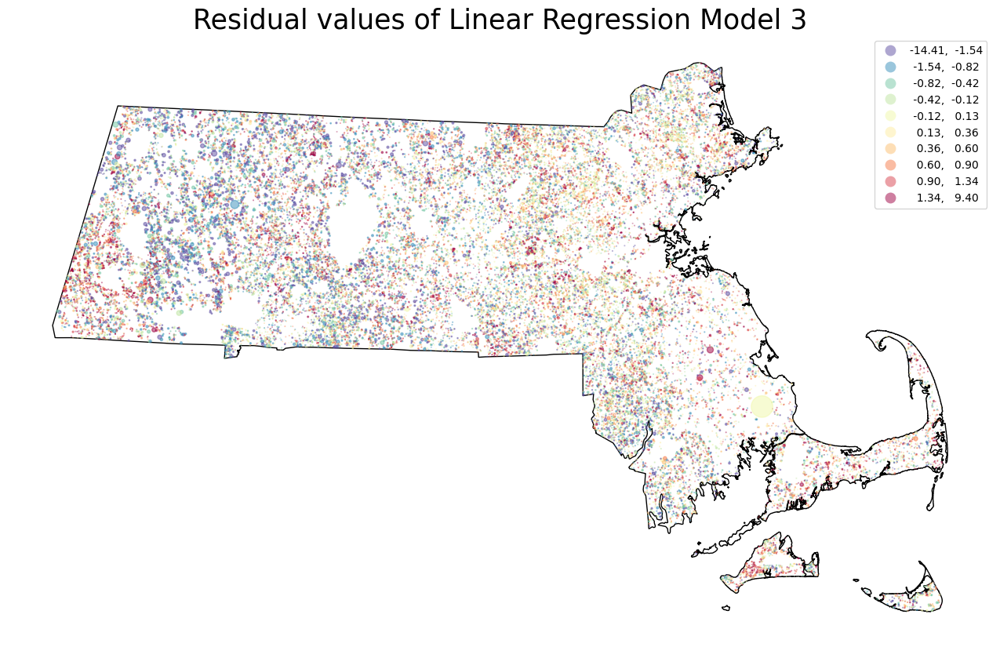

In [44]:
fig, ax = plt.subplots(figsize=(17, 10))
dp = shp_c.join(model_ls_ols3.resid.rename('resid'), how='inner')
#inner join is necessary so that only observations having predicted values are retained.
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp.plot(
    'resid',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
    )
ax.axis('off')

ax.set_title('Residual values of Linear Regression Model 3', fontdict={'fontsize': '25', 'fontweight' : '3'})

filepath = "/Users/jiunlee/Documents/Fall_23/EE508/Labs/Lab3/1_ls_ols3_resid.png"
plt.savefig(filepath, dpi=150, facecolor='white')

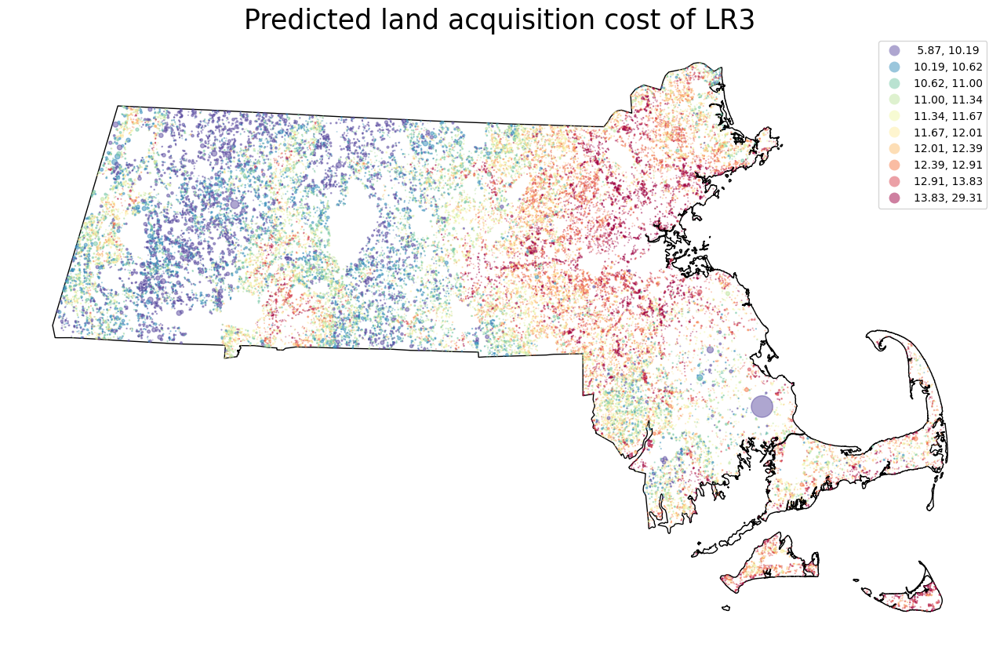

In [46]:
#create a map of predicted values
fig, ax = plt.subplots(figsize=(17, 10))
dp = shp_c.join(model_ls_ols3.fittedvalues.rename('pred'), how='inner')
#inner join is necessary so that only observations having predicted values are retained.
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
    )
ax.axis('off')

ax.set_title('Predicted land acquisition cost of LR3', fontdict={'fontsize': '25', 'fontweight' : '3'})

filepath = "/Users/jiunlee/Documents/Fall_23/EE508/Labs/Lab3/1_ls_ols3_pred.png"
plt.savefig(filepath, dpi=150, facecolor='white')

### Linear regressions and predictive modeling in scikit-learn 

In [50]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import (
ExtraTreesRegressor,
GradientBoostingRegressor,
RandomForestRegressor
)
from sklearn.model_selection import train_test_split, KFold

In [51]:
model = LinearRegression()
model.fit(X_ls, y_ls)
model.predict(X_ls)
mean_squared_error(y_ls, model.predict(X_ls))

1.980329829753318

In [52]:
model = LinearRegression()
model.fit(X_ls2, y_ls)
model.predict(X_ls2)
mean_squared_error(y_ls, model.predict(X_ls2))

1.957007091650473

In [53]:
model = LinearRegression()
model.fit(X_ls3, y_ls)
model.predict(X_ls3)
mean_squared_error(y_ls, model.predict(X_ls3))

1.6841173295550722

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X_ls, y_ls)
model = LinearRegression()
model.fit(X_train, y_train)
mean_squared_error(y_test, model.predict(X_test))

1.9128634039178405

### k-fold cross validation (k=5)

In [55]:
X = X_ls
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = LinearRegression()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4)) #similar MSEs

1, 2, 3, 4, 5, Avg MSE (within-sample): 1.98
Avg MSE (out-of-sample): 1.9834


In [56]:
X = X_ls2
y = y_ls
mse_train = []
mse_test2 = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = LinearRegression()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test2 += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test2), 4)) #similar MSEs

1, 2, 3, 4, 5, Avg MSE (within-sample): 1.9564
Avg MSE (out-of-sample): 1.963


In [57]:
X = X_ls3
y = y_ls
mse_train = []
mse_test3 = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = LinearRegression()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test3 += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test3), 4)) #similar MSEs

1, 2, 3, 4, 5, Avg MSE (within-sample): 1.678
Avg MSE (out-of-sample): 1.7702


- Notice how differences between the within-sample and out-of-sample predictions tends to increase as you add variables. This is a typical pattern of overfitting.

In [58]:
# Create a csv file to start documenting the average out-of-sample MSE you get for each model.
ols = round(np.mean(mse_test), 4) 
ols2 =round(np.mean(mse_test2), 4)
ols3 = round(np.mean(mse_test3), 4)
df= [["ols",ols], ["ols2",ols2],["ols3",ols3]]
mse = pd.DataFrame(df,columns=['model', 'mean_squared_error'])
mse

,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77


## Emsemble methods
- Ensemble methods tend to be good at fitting models to non-linear and irregular patterns. We will test three of them: gradient boosting, random forests, and extremely randomized trees. 

### Gradient Boosting 

In [79]:
X = X_ls
y = y_ls

model = GradientBoostingRegressor()
mse_train = []
mse_test_gb = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_gb += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_gb), 4)) #similar MSEs

gb = round(np.mean(mse_test_gb), 4) 

new_df = pd.DataFrame([["gb", gb]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 1.4133
Avg MSE (out-of-sample): 1.4751


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


### Random Forest (20 trees)

In [80]:

X = X_ls
y = y_ls

model = RandomForestRegressor(n_estimators=20)
mse_train = []
mse_test_rf = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_rf += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_rf), 4)) #similar MSEs

rf = round(np.mean(mse_test_rf), 4) 


new_df = pd.DataFrame([["rf", rf]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 0.225
Avg MSE (out-of-sample): 1.4066


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


### Extremely randomized trees regressor

In [81]:
X = X_ls
y = y_ls

model = ExtraTreesRegressor(n_estimators=50)
mse_train = []
mse_test_et = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_et += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_et), 4)) #similar MSEs

et = round(np.mean(mse_test_et), 4) 


new_df = pd.DataFrame([["et", et]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.3477


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


<Axes: >

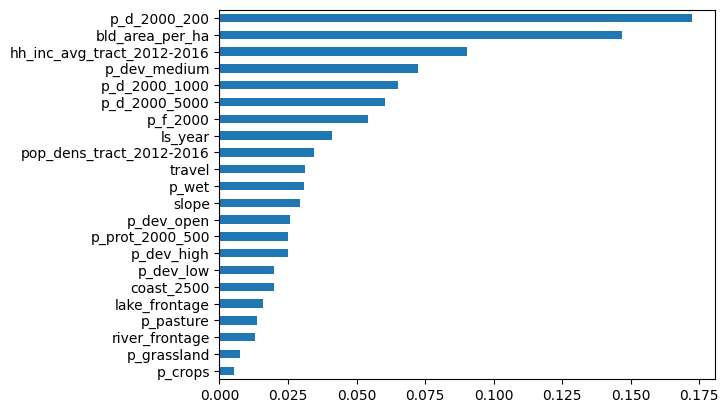

In [82]:
feat_imp = pd.Series(model.feature_importances_, index=X.columns)
feat_imp.sort_values().plot(kind='barh')

Text(0.5, 1.0, 'Predicted land acquisition cost of ERT model')

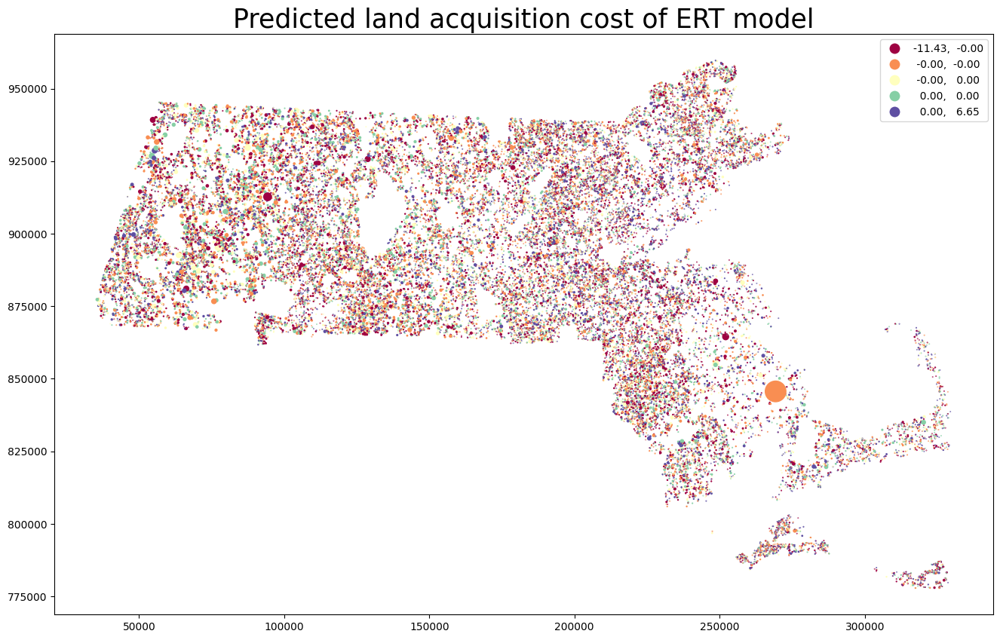

In [83]:
y_pred = pd.Series(model.predict(X), index=X.index)
resid = (y - y_pred).rename('resid')
shp_p = shp_c.join(resid, how='inner')


shp_p.plot(

'resid',
markersize='ms',
scheme='quantiles',
legend=True,
cmap='Spectral',
figsize=(17, 10)
).set_title('Predicted land acquisition cost of ERT model', fontdict={'fontsize': '25', 'fontweight' : '3'})


### Out-of-bag (OOB) estimates
- Each decision tree is trained on a subset of the data. OOB estimates are predictions made on the part of the training data not used for a particular tree. This mimics the out-of-sample prediction since the trees haven't seen this data during training.
- The Problem with Computing Residuals for Tree-Based Models: Residuals are the differences between observed values and values predicted by the model. For tree-based models, calculating residuals using the training data (within-sample) is misleading because of the self-referential nature of the predictions.

Text(0.5, 1.0, 'Predicted land acquisition cost of ERT model(OOB)')

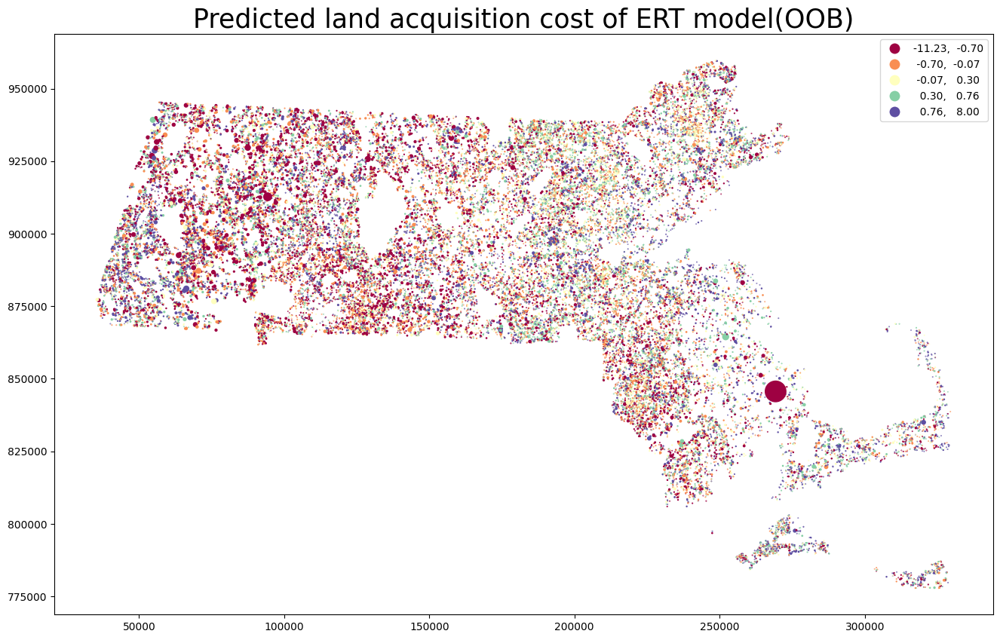

In [84]:
model = ExtraTreesRegressor(n_estimators=50, bootstrap=True, oob_score=True)
model.fit(X, y)
y_pred = pd.Series(model.oob_prediction_, index=X.index)
resid = (y - y_pred).rename('resid')
shp_p = shp_c.join(resid, how='inner')
shp_p.plot(
'resid',
markersize='ms',
scheme='quantiles',
legend=True,
cmap='Spectral',
figsize=(17, 10)
).set_title('Predicted land acquisition cost of ERT model(OOB)', fontdict={'fontsize': '25', 'fontweight' : '3'})

### Add x and y coordinates of each parcel to X_ls

- To incorporate differences across space that are not captured by our other variables, we can add x and y coordinates of each parcel to X_ls.

In [85]:
#Create a dataframe with the x and y coordinates of the centroids
shp_c['x'] = shp_c['geometry'].x
shp_c['y'] = shp_c['geometry'].y
coords = shp_c[['x', 'y']]
coords

,x,y
pid,,
M_252104_934240,252103.86,934239.87
F_803174_3027860,244807.92,922893.45
M_238118_942044,238099.16,942052.15
F_736007_3068967,224335.53,935423.15
M_240445_943056,240370.27,943069.13
...,...,...
M_67459_886161,67459.17,886160.58
F_172467_2984485,52631.50,909861.54
M_66650_919364,66935.14,919572.58


In [86]:
X = X_ls.join(coords) 
y = y_ls
len(X)
len(y)

44424

In [87]:
model = GradientBoostingRegressor()
mse_train = []
mse_test_gb = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_gb += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_gb), 4)) #similar MSEs

gb_coords= round(np.mean(mse_test_gb), 4) 

new_df = pd.DataFrame([["gb_coords", gb_coords]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 1.3649
Avg MSE (out-of-sample): 1.4229


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


In [88]:
model = RandomForestRegressor(n_estimators=20)
mse_train = []
mse_test_rf = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_rf += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_rf), 4)) #similar MSEs

rf_coords = round(np.mean(mse_test_rf), 4) 


new_df = pd.DataFrame([["rf_coords", rf_coords]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 0.2177
Avg MSE (out-of-sample): 1.3605


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


In [89]:

model = ExtraTreesRegressor(n_estimators=50)
mse_train = []
mse_test_et = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_et += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_et), 4)) #similar MSEs

et_coords = round(np.mean(mse_test_et), 4) 


new_df = pd.DataFrame([["et_coords", et_coords]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.2884


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


In [90]:
#Increase the number of boosting stages
model = GradientBoostingRegressor(n_estimators=1000)
mse_train = []
mse_test_gb = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_gb += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_gb), 4)) #similar MSEs

gb_coords_1000= round(np.mean(mse_test_gb), 4) 


new_df = pd.DataFrame([["gb_coords_1000", gb_coords_1000]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

1, 2, 3, 4, 5, Avg MSE (within-sample): 1.0246
Avg MSE (out-of-sample): 1.3086


,model,mean_squared_error
0,ols,1.98
1,ols2,1.96
2,ols3,1.77
3,gb,1.48
4,rf,1.41
5,et,1.35
6,rf,1.42
7,et,1.35
8,et_coords_250,1.34
9,gb,1.48


In [91]:
#save the model
import pickle
pickle.dump(model, open(wf('model_saved/gb_coords_1000.p'), 'wb'))
#model = pickle.load(open(wf('model_name.p'), 'rb')) #loading the model

In [92]:
model = RandomForestRegressor(n_estimators=100, oob_score=True)
mse_train = []
mse_test_rf = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_rf += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_rf), 4)) #similar MSEs

rf_coords_100 = round(np.mean(mse_test_rf), 4) 


new_df = pd.DataFrame([["rf_coords_100", rf_coords_100]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

pickle.dump(model, open(wf('model_saved/rf_coords_100.p'), 'wb'))


1, 2, 3, 4, 5, Avg MSE (within-sample): 0.1832
Avg MSE (out-of-sample): 1.3086


In [94]:
model = ExtraTreesRegressor(n_estimators=100, bootstrap=True, oob_score=True)
mse_train = []
mse_test_et = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_et += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_et), 4)) #similar MSEs

et_coords_100 = round(np.mean(mse_test_et), 4) 


new_df = pd.DataFrame([["et_coords_100", et_coords_100]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

pickle.dump(model, open(wf('model_saved/et_coords_100.p'), 'wb'))


1, 2, 3, 4, 5, Avg MSE (within-sample): 0.1816
Avg MSE (out-of-sample): 1.299


In [95]:
model = ExtraTreesRegressor(n_estimators=250, bootstrap=True, oob_score=True)
mse_train = []
mse_test_et = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    print(len(mse_train) + 1, end=', ')
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test_et += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test_et), 4)) #similar MSEs

et_coords_250 = round(np.mean(mse_test_et), 4) 


new_df = pd.DataFrame([["et_coords_250", et_coords_250]], columns=['model', 'mean_squared_error'])
mse = pd.concat([mse, new_df], ignore_index=True)
mse

pickle.dump(model, open(wf('model_saved/et_coords_250.p'), 'wb'))

1, 2, 3, 4, 5, Avg MSE (within-sample): 0.1768
Avg MSE (out-of-sample): 1.2882


mse

In [96]:
mse = mse.set_index('model')
mse

,mean_squared_error
model,
ols,1.98
ols2,1.96
ols3,1.77
gb,1.48
rf,1.41
et,1.35
rf,1.42
et,1.35
et_coords_250,1.34


In [97]:
#saving dataframe as csv file

mse.to_csv("1_mean_prediction_error_out_of_sample.csv",index=True ) 

#### create maps of predicted values and residuals for the best random forest regression we have run so far 

In [98]:
#create predictions of land value for the entire state of Massachusetts.
xcols_ls_pred = [v for v in XCOLS_LS if v != 'ls_year']
i_ls_pred = d[xcols_ls_pred].isnull().sum(1).eq(0) & d['p_prot'].le(5)
X_ls_pred = d.loc[i_ls_pred, xcols_ls_pred]
X_ls_pred['ls_year'] = 2010

X_ls_pred

,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,pop_dens_tract_2012-2016,hh_inc_avg_tract_2012-2016,p_f_2000,p_prot_2000_500,...,p_d_2000_5000,p_dev_open,p_dev_low,p_dev_medium,p_dev_high,p_crops,p_pasture,p_grassland,bld_area_per_ha,ls_year
pid,,,,,,,,,,,,,,,,,,,,,
F_803174_3027860,3.27,8.00,0.00,0.00,0.00,0.00,527.58,111868.26,46,11,...,66,15.00,31.00,8.00,0.00,0.00,0.00,0.00,3124.78,2010
M_238118_942044,6.32,14.00,10.00,0.00,0.00,0.00,274.51,115417.94,97,19,...,22,0.00,0.00,0.00,0.00,0.00,6.00,0.00,1471.82,2010
M_240445_943056,2.54,20.00,48.00,0.00,0.00,0.00,274.51,115417.94,59,3,...,21,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3155.20,2010
M_245474_951109,1.78,19.00,21.00,7.00,0.00,0.00,117.58,163715.53,0,3,...,23,30.00,0.00,0.00,0.00,0.00,52.00,0.00,1055.50,2010
F_778757_3113679,7.64,8.00,4.00,4.13,0.00,0.00,710.83,86602.90,99,30,...,34,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_74987_889210,9.17,41.43,7.00,0.00,0.00,381.20,10.02,87422.72,97,1,...,3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2010
F_182440_2984399,4.41,48.25,36.00,0.00,0.00,1836.00,181.48,94874.91,34,6,...,34,47.00,2.00,1.00,0.00,0.00,0.00,0.00,0.00,2010
M_74001_894053,7.23,152.00,31.00,0.00,0.00,1090.40,10.02,87422.72,85,5,...,3,0.00,0.00,0.00,0.00,0.00,4.00,0.00,23.84,2010


In [99]:
# rf_coords_100 Model
model =  pickle.load(open(wf('model_saved/rf_coords_100.p'), 'rb')) #loading the model:Random Forest 100

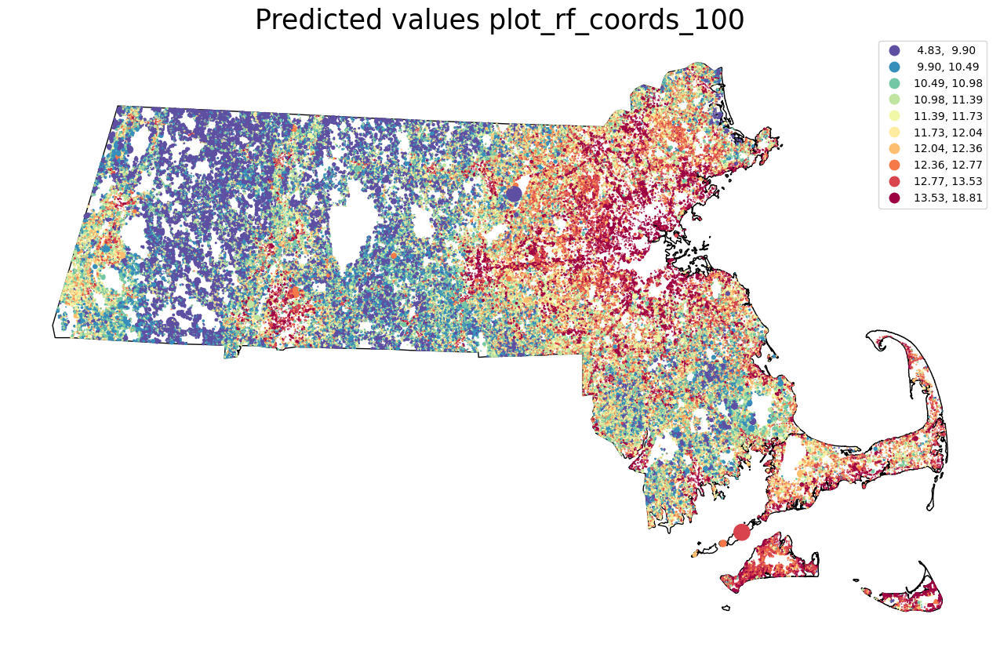

In [100]:
#create a map of predicted values
fig, ax = plt.subplots(figsize=(17, 10))
model.fit(X, y) #X = X_ls.join(coords), y = y_ls

y_pred = pd.Series(model.predict(X_ls_pred.join(coords)), index=X_ls_pred.index)
shp_p = shp_c.join(y_pred.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'pred',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
   k=10,
    cmap='Spectral_r',
    figsize=(17, 10)
)
ax.axis('off')

ax.set_title('Predicted values plot_rf_coords_100', fontdict={'fontsize': '25', 'fontweight' : '3'})
#### 

#
#dp = shp_c.join(model_ls_ols3.fittedvalues.rename('pred'), how='inner')
#shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
# dp.plot('pred',ax=ax,
#     markersize='ms',
#     alpha=0.5,
#     cmap='Spectral_r',
#     scheme='quantiles',
#     k=10,
#     legend=True
#     )
#ax.axis('off')



filepath = wf("1_ls_rf_coords_100_pred.png")
plt.savefig(filepath, dpi=150, facecolor='white')

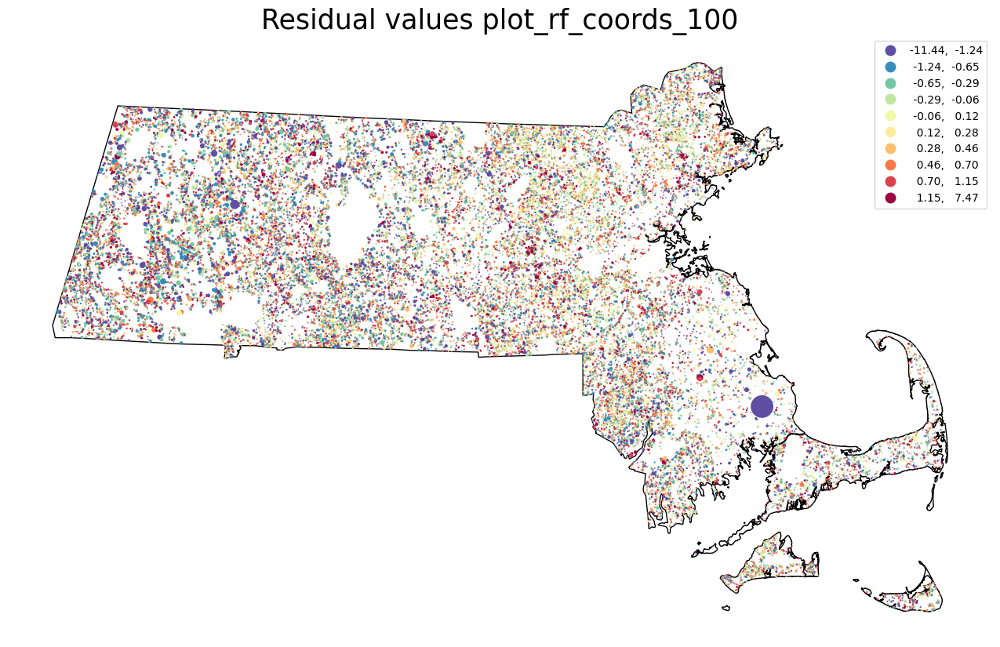

In [101]:
#residual values plot
#model.fit(X, y) #omitted because it's in previous cell.
y_pred = pd.Series(model.oob_prediction_, index=X.index)
resid = (y - y_pred).rename('resid')

shp_p = shp_c.join(resid, how='inner')

fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'resid',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    k=10,
    cmap='Spectral_r'
)

ax.axis('off')

ax.set_title('Residual values plot_rf_coords_100', fontdict={'fontsize': '25', 'fontweight' : '3'})


filepath = wf("1_ls_rf_coords_100_resid.png")
plt.savefig(filepath, dpi=150, facecolor='white')

In [102]:
 #loading the model et_coords_250
model =  pickle.load(open(wf('model_saved/et_coords_250.p'), 'rb'))

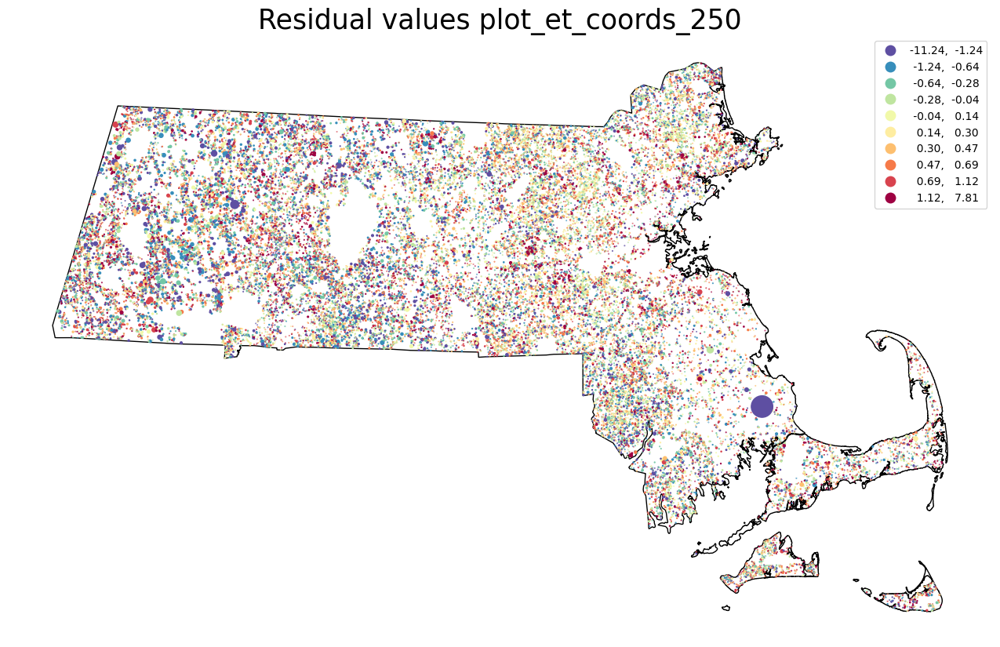

In [103]:
#residual values plot
model.fit(X, y) #X = X_ls.join(coords), y = y_ls
y_pred = pd.Series(model.oob_prediction_, index=X.index)
resid = (y - y_pred).rename('resid')

shp_p = shp_c.join(resid, how='inner')

fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'resid',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    k=10,
    cmap='Spectral_r'
)

ax.axis('off')

ax.set_title('Residual values plot_et_coords_250', fontdict={'fontsize': '25', 'fontweight' : '3'})


filepath = wf("1_ls_et_coords_250_resid.png")
plt.savefig(filepath, dpi=150, facecolor='white')

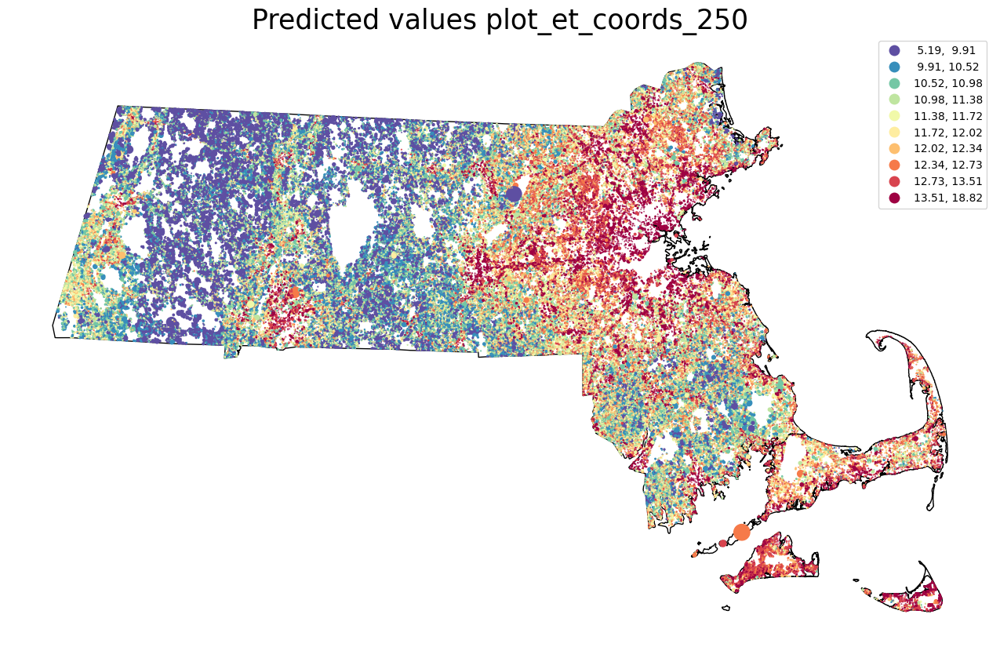

In [104]:
#create a map of predicted values
fig, ax = plt.subplots(figsize=(17, 10))
#model.fit(X, y) #omitted because it's in previous cell.
y_pred = pd.Series(model.predict(X_ls_pred.join(coords)), index=X_ls_pred.index)
shp_p = shp_c.join(y_pred.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'pred',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
   k=10,
    cmap='Spectral_r',
    figsize=(17, 10)
)
ax.axis('off')

ax.set_title('Predicted values plot_et_coords_250', fontdict={'fontsize': '25', 'fontweight' : '3'})


filepath = wf("1_ls_et_coords_250_pred.png")
plt.savefig(filepath, dpi=150, facecolor='white')



### Predicting forest change
- We found that extremely randomized trees regressor with 250 estimators is the best model. Let's predict the forest loss using tihs model.

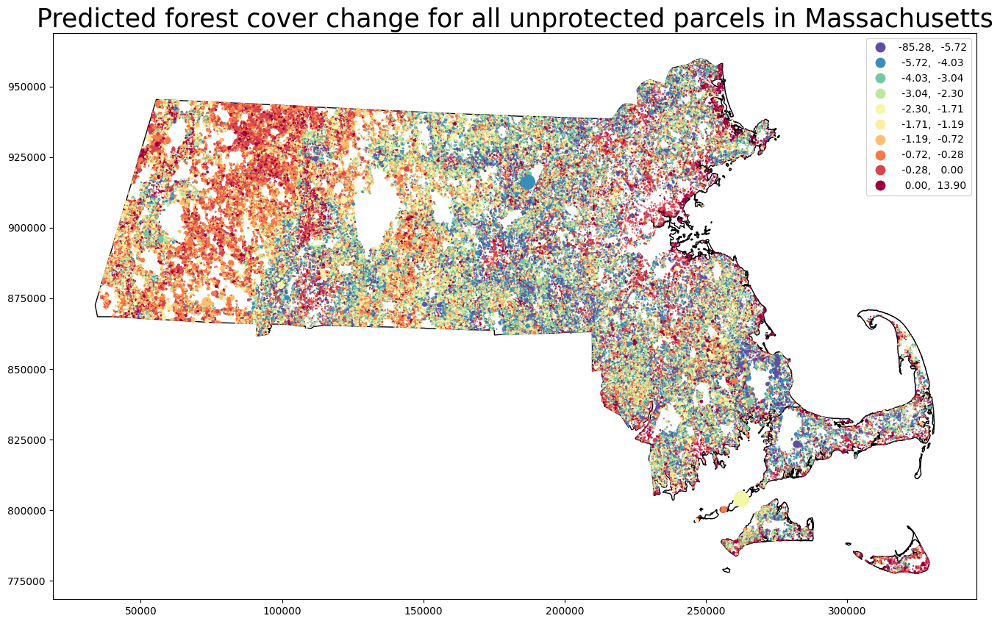

In [105]:
X=X_fc
y=y_fc

fig, ax = plt.subplots(figsize=(17, 10))
model = ExtraTreesRegressor(n_estimators=250, bootstrap=True, oob_score=True)
model.fit(X, y)
y_pred = pd.Series(model.oob_prediction_, index=X.index)

shp_p = shp_c.join(y_pred.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')

shp_p.plot(
    'pred',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
   k=10,
    cmap='Spectral_r',
    figsize=(17, 10)
)


ax.set_title('Predicted forest cover change for all unprotected parcels in Massachusetts', fontdict={'fontsize': '25', 'fontweight' : '3'})

filepath = wf("1_fc_et_pred.png")
plt.savefig(filepath, dpi=150, facecolor='white')

